In [1]:
# !pip install twitter 
# !pip install NetworkX
# !pip install powerlaw
#!pip install string

In [1]:
import powerlaw
import pandas as pd
from textblob import TextBlob
import requests
import pickle
import json
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import nltk
from nltk import ngrams
from nltk.corpus import stopwords
import re
import networkx as nx

In [2]:
df = pd.read_csv('df_tutti.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 102170 entries, 0 to 102169
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Unnamed: 0      102170 non-null  int64  
 1   Unnamed: 0.1    48588 non-null   float64
 2   date            102170 non-null  object 
 3   user_id         102170 non-null  float64
 4   username        102170 non-null  object 
 5   name            102168 non-null  object 
 6   tweet           102170 non-null  object 
 7   mentions        102170 non-null  object 
 8   replies_count   102170 non-null  float64
 9   retweets_count  102170 non-null  float64
 10  likes_count     102170 non-null  float64
 11  hashtags        102170 non-null  object 
 12  retweet         102170 non-null  bool   
 13  reply_to        102170 non-null  object 
 14  target          0 non-null       float64
dtypes: bool(1), float64(6), int64(1), object(7)
memory usage: 11.0+ MB


In [3]:
df=df.drop_duplicates('tweet', keep='first')
df['tweet'].head(10)

0    Notizie: Elezioni Politiche di domenica 25 set...
1    La paura che ho di vedere la Meloni premier è ...
2    @Laura_Virgy Veloce che manca poco al 25 sette...
3    @ascochita @mariamarilucen @CottarelliCPI @Ale...
4    #ForzaItalia che rispolvera il suo leader #Ber...
5    Grazie dell’informazione Giorgietta, ne farò t...
6    @SsIstevini è stato zitto sul green pass, può ...
7    @alanfriedmanit ..calma e sangue freddo Friedm...
8    Se volete bene a voi stessi, ai vostri famigli...
9    Nexo Digital presenta EVANGELION 3.0 - il 25 s...
Name: tweet, dtype: object

In [4]:
import string
string.punctuation
def remove_punct(text):
    text  = "".join([char for char in text if char not in string.punctuation])
    text = re.sub('[0-9]+', '', text)
    return text

df['Tweet_punct'] = df['tweet'].apply(lambda x: remove_punct(x))
df['Tweet_punct'].head(10)

0    Notizie Elezioni Politiche di domenica  settem...
1    La paura che ho di vedere la Meloni premier è ...
2       LauraVirgy Veloce che manca poco al  settembre
3    ascochita mariamarilucen CottarelliCPI Alessia...
4    ForzaItalia che rispolvera il suo leader Berlu...
5    Grazie dell’informazione Giorgietta ne farò te...
6    SsIstevini è stato zitto sul green pass può ta...
7    alanfriedmanit calma e sangue freddo Friedman ...
8    Se volete bene a voi stessi ai vostri famiglia...
9    Nexo Digital presenta EVANGELION   il  settemb...
Name: Tweet_punct, dtype: object

In [5]:
# Create a sublist of lower case words for each tweet

words_in_tweet = [tweet.lower().split() for tweet in df['Tweet_punct']]
words_in_tweet

[['notizie',
  'elezioni',
  'politiche',
  'di',
  'domenica',
  'settembre',
  'httpstcolllbpyly'],
 ['la',
  'paura',
  'che',
  'ho',
  'di',
  'vedere',
  'la',
  'meloni',
  'premier',
  'è',
  'reale',
  'settembre'],
 ['lauravirgy', 'veloce', 'che', 'manca', 'poco', 'al', 'settembre'],
 ['ascochita',
  'mariamarilucen',
  'cottarellicpi',
  'alessiamorani',
  'troll',
  'carissimo',
  'caschi',
  'male',
  'ce',
  'ne',
  'fottiamo',
  'del',
  'tuo',
  'liberismo',
  'preparati',
  'per',
  'la',
  'samba',
  'che',
  'vi',
  'daremo',
  'il',
  'settembre',
  '🇮🇹🇮🇹🇮🇹😂',
  'bastapd'],
 ['forzaitalia',
  'che',
  'rispolvera',
  'il',
  'suo',
  'leader',
  'berlusconi',
  'per',
  'le',
  'elezioni',
  'settembre'],
 ['grazie',
  'dell’informazione',
  'giorgietta',
  'ne',
  'farò',
  'tesoro',
  'il',
  'settembre',
  '🙅🏻\u200d♂️',
  'il',
  'vero',
  'volto',
  'di',
  'giorgia',
  'meloni',
  'httpstcozfcoqemdz',
  'via',
  'youtube'],
 ['ssistevini',
  'è',
  'stato',
  '

In [6]:
# Download stopwords

nltk.download('stopwords')
nltk.download('punkt')
stop_words = set(stopwords.words('italian'))

# stop_words.remove('non')
# Remove stop words from each tweet list of words

tweets_nsw = [[word for word in tweet_words if not word in stop_words]
              for tweet_words in words_in_tweet]

#create a unique list from all tweets, and set to dataframe

word= [item for sublist in tweets_nsw for item in sublist]
words=pd.DataFrame()
words['word']=word
words['count'] = df.apply(lambda _: '', axis=1)

[nltk_data] Error loading stopwords: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>
[nltk_data] Error loading punkt: <urlopen error [Errno 11001]
[nltk_data]     getaddrinfo failed>


In [7]:
pd.set_option('display.max_rows', 500)

#remove word with len<val in a list of list

def remove_values_from_listoflist(the_list, val):
    for i in range(0,len(the_list)):
        r=[value for value in the_list[i] if len(value)<val]
        for j in range(0, len(r)):
            the_list[i].remove(r[j])
    return the_list
x=remove_values_from_listoflist(tweets_nsw, 4)

#remove word with len<val in a list of list

def remove_values_from_list(the_list, val):
    return [value for value in the_list if len(value)>val]

y=remove_values_from_list(word, 4)
x

[['notizie',
  'elezioni',
  'politiche',
  'domenica',
  'settembre',
  'httpstcolllbpyly'],
 ['paura', 'vedere', 'meloni', 'premier', 'reale', 'settembre'],
 ['lauravirgy', 'veloce', 'manca', 'poco', 'settembre'],
 ['ascochita',
  'mariamarilucen',
  'cottarellicpi',
  'alessiamorani',
  'troll',
  'carissimo',
  'caschi',
  'male',
  'fottiamo',
  'liberismo',
  'preparati',
  'samba',
  'daremo',
  'settembre',
  '🇮🇹🇮🇹🇮🇹😂',
  'bastapd'],
 ['forzaitalia',
  'rispolvera',
  'leader',
  'berlusconi',
  'elezioni',
  'settembre'],
 ['grazie',
  'dell’informazione',
  'giorgietta',
  'tesoro',
  'settembre',
  '🙅🏻\u200d♂️',
  'vero',
  'volto',
  'giorgia',
  'meloni',
  'httpstcozfcoqemdz',
  'youtube'],
 ['ssistevini',
  'stato',
  'zitto',
  'green',
  'pass',
  'tacere',
  'fino',
  'settembre'],
 ['alanfriedmanit',
  'calma',
  'sangue',
  'freddo',
  'friedman',
  'proseguire',
  'così',
  'sera',
  'settembre',
  'rischia',
  'fare',
  'armi',
  'bagagli',
  'ritornare',
  'ameri

In [8]:
#Count the word's occurence
c=pd.Series(y).value_counts()

#Select a range of occurence's values
def select_range(series,lim,k):
    # sel=pd.Series([])
    for i in range(0, lim,k ):
        if i==0:
            temp= series[(series>i)&(series<i+k)]
            sel=temp.head(10000)
        else:
            temp= series[(series>i)&(series<i+k)]
            conc=pd.concat([sel,temp])
    return conc
p=select_range(c, 100, 5)
#NB:The word are the index!
# p=c[(c>0)&(c<5)]
b=p.index

#obtain a list of the selected word/index
d=pd.Index.tolist(b)
d

['infantili',
 'incontrano',
 'sembravi',
 'piazzati',
 'sondaggista',
 'marinotoma',
 'calante',
 'soternicol',
 'eliminano',
 'stime',
 'ingredienti',
 'discettare',
 'gravidanza',
 'qualunquismo',
 'ottoemezzola',
 'dialogare»',
 'scappata',
 'ilmici',
 'indiscutibile',
 'scrittura',
 'supermercati',
 'registi',
 'marcolillo',
 'ordinare',
 'efficacia',
 'attrarre',
 'omicidi',
 'ebraica',
 'domdellavalle',
 'ripostato',
 'filbarbera',
 'spazzati',
 'frigo',
 'doriananera',
 'soprusi',
 'sentitamente',
 'possiede',
 'aspettavamo',
 'disastrata',
 'catastrofico',
 'frego',
 'differenzia',
 'avervi',
 'leditoriale',
 '“democratico”',
 'burina',
 'identificare',
 'riceverà',
 'oltreché',
 'uneuropa',
 'pdcancro',
 'allenatore',
 'guadagnerà',
 'bidone',
 'cascare',
 'affinità',
 'visconti',
 'rosicano',
 'piango',
 'siria',
 'linfame',
 'nientemeno',
 'dellagenzia',
 'dittature',
 'profezie',
 'rafmardra',
 'lottando',
 'inotginot',
 'italiche',
 'mammoni',
 'credevano',
 'antifascista

In [9]:
terms_bigram = [list(ngrams(tweet,2)) for tweet in x]
terms_bigram


[[('notizie', 'elezioni'),
  ('elezioni', 'politiche'),
  ('politiche', 'domenica'),
  ('domenica', 'settembre'),
  ('settembre', 'httpstcolllbpyly')],
 [('paura', 'vedere'),
  ('vedere', 'meloni'),
  ('meloni', 'premier'),
  ('premier', 'reale'),
  ('reale', 'settembre')],
 [('lauravirgy', 'veloce'),
  ('veloce', 'manca'),
  ('manca', 'poco'),
  ('poco', 'settembre')],
 [('ascochita', 'mariamarilucen'),
  ('mariamarilucen', 'cottarellicpi'),
  ('cottarellicpi', 'alessiamorani'),
  ('alessiamorani', 'troll'),
  ('troll', 'carissimo'),
  ('carissimo', 'caschi'),
  ('caschi', 'male'),
  ('male', 'fottiamo'),
  ('fottiamo', 'liberismo'),
  ('liberismo', 'preparati'),
  ('preparati', 'samba'),
  ('samba', 'daremo'),
  ('daremo', 'settembre'),
  ('settembre', '🇮🇹🇮🇹🇮🇹😂'),
  ('🇮🇹🇮🇹🇮🇹😂', 'bastapd')],
 [('forzaitalia', 'rispolvera'),
  ('rispolvera', 'leader'),
  ('leader', 'berlusconi'),
  ('berlusconi', 'elezioni'),
  ('elezioni', 'settembre')],
 [('grazie', 'dell’informazione'),
  ('dell’inf

In [12]:
from itertools import combinations
for i in range(0,len(x)):
    if i==0:
        comb=list(combinations(x[i], 2))
    else:
        comb[len(comb):]=list(combinations(x[i], 2))


In [13]:
# Create counter of words in clean bigrams
bigram_counts = collections.Counter(comb)

bigram_df = pd.DataFrame(bigram_counts.most_common(500000),
                             columns=['bigram', 'count'])


# Create dictionary of bigrams and their counts
d = bigram_df.set_index('bigram').T.to_dict('records')
d[0].items()
len(d[0])

500000

In [14]:
bigram_counts.most_common(300)

[(('partito', 'democratico'), 2679),
 (('giorgia', 'meloni'), 2373),
 (('giorgiameloni', 'meloni'), 1772),
 (('rulajebreal', 'meloni'), 1624),
 (('governo', 'meloni'), 1276),
 (('meloni', 'padre'), 1205),
 (('meloni', 'salvini'), 1174),
 (('padre', 'meloni'), 1108),
 (('carlocalenda', 'calenda'), 1100),
 (('meloni', 'meloni'), 1044),
 (('renzi', 'calenda'), 978),
 (('meloni', 'governo'), 935),
 (('salvini', 'meloni'), 836),
 (('calenda', 'renzi'), 809),
 (('meloni', 'draghi'), 803),
 (('meloni', 'solo'), 764),
 (('votato', 'meloni'), 711),
 (('meloni', 'fare'), 706),
 (('meloni', 'fatto'), 703),
 (('campagna', 'elettorale'), 700),
 (('carlocalenda', 'azioneit'), 700),
 (('draghi', 'meloni'), 691),
 (('cosa', 'meloni'), 666),
 (('rulajebreal', 'giorgiameloni'), 664),
 (('fatto', 'meloni'), 663),
 (('solo', 'meloni'), 660),
 (('azioneit', 'italiaviva'), 652),
 (('repubblica', 'meloni'), 637),
 (('salvini', 'governo'), 633),
 (('meloni', 'quando'), 631),
 (('meloni', 'cosa'), 609),
 (('ca

In [15]:
# Create network plot
G = nx.Graph()
G_noweight = nx.Graph()


# Create connections between nodes
for k, v in d[0].items():
    G.add_edge(k[0], k[1], weight=(v * 0))
    G_noweight.add_edge(k[0], k[1])
'''for k, v in d[0].items():
    G.add_edge(k[1], k[2], weight=(v * 10))
for k, v in d[0].items():
    G.add_edge(k[0], k[2], weight=(v * 10))'''        
G.number_of_edges()
G_noweight.number_of_edges()

425037

dict_items([(('partito', 'democratico'), 2679), (('giorgia', 'meloni'), 2373), (('giorgiameloni', 'meloni'), 1772), (('rulajebreal', 'meloni'), 1624), (('governo', 'meloni'), 1276), (('meloni', 'padre'), 1205), (('meloni', 'salvini'), 1174), (('padre', 'meloni'), 1108), (('carlocalenda', 'calenda'), 1100), (('meloni', 'meloni'), 1044), (('renzi', 'calenda'), 978), (('meloni', 'governo'), 935), (('salvini', 'meloni'), 836), (('calenda', 'renzi'), 809), (('meloni', 'draghi'), 803), (('meloni', 'solo'), 764), (('votato', 'meloni'), 711), (('meloni', 'fare'), 706), (('meloni', 'fatto'), 703), (('campagna', 'elettorale'), 700), (('carlocalenda', 'azioneit'), 700), (('draghi', 'meloni'), 691), (('cosa', 'meloni'), 666), (('rulajebreal', 'giorgiameloni'), 664), (('fatto', 'meloni'), 663), (('solo', 'meloni'), 660), (('azioneit', 'italiaviva'), 652), (('repubblica', 'meloni'), 637), (('salvini', 'governo'), 633), (('meloni', 'quando'), 631), (('meloni', 'cosa'), 609), (('carlocalenda', 'meloni

[]

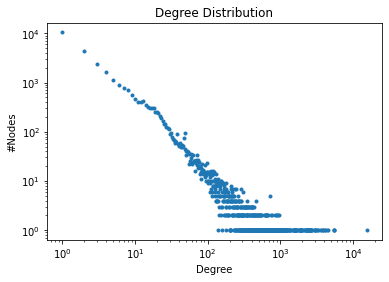

In [16]:
hist = nx.degree_histogram(G)
hist2 = nx.degree_histogram(G_noweight)

plt.plot(range(0, len(hist)), hist,'.')
#plt.plot(range(0, len(hist2)), hist,'-')
plt.title("Degree Distribution")
plt.xlabel("Degree")
plt.ylabel("#Nodes")
# plt.ylim(0,50)
# plt.xlim(0,1)
plt.loglog()
# plt.show()

In [17]:
df

,Unnamed: 0,Unnamed: 0.1,date,user_id,username,name,tweet,mentions,replies_count,retweets_count,likes_count,hashtags,retweet,reply_to,target,Tweet_punct
0,0,0.0,2022-08-11,9.734525e+08,villasantacomun,Comune di Villasanta,Notizie: Elezioni Politiche di domenica 25 set...,[],0.0,0.0,0.0,[],False,[],NaN,Notizie Elezioni Politiche di domenica settem...
1,1,1.0,2022-08-11,3.072289e+09,davidemarcone_,Davide,La paura che ho di vedere la Meloni premier è ...,[],0.0,0.0,0.0,['25settembre'],False,[],NaN,La paura che ho di vedere la Meloni premier è ...
2,2,2.0,2022-08-11,7.076589e+08,demarchifra,Francesco Saverio,@Laura_Virgy Veloce che manca poco al 25 sette...,[],0.0,0.0,1.0,[],False,"[{'screen_name': 'Laura_Virgy', 'name': 'Laura...",NaN,LauraVirgy Veloce che manca poco al settembre
3,3,3.0,2022-08-11,1.304916e+18,cavalierebianc5,cavalierebianco,@ascochita @mariamarilucen @CottarelliCPI @Ale...,[],0.0,0.0,0.0,['bastapd'],False,"[{'screen_name': 'ascochita', 'name': 'Alessan...",NaN,ascochita mariamarilucen CottarelliCPI Alessia...
4,4,4.0,2022-08-11,9.830677e+17,gabriflo1,Gabriele Floris 🇪🇺🇮🇹,#ForzaItalia che rispolvera il suo leader #Ber...,[],0.0,2.0,7.0,"['forzaitalia', 'berlusconi', '25settembre']",False,[],NaN,ForzaItalia che rispolvera il suo leader Berlu...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71597,71597,NaN,2022-09-27,1.106966e+18,fpaffy,Fabri #RestiamoUmani,@ggarassino93 Non sarebbe cambiato molto visto...,[],1.0,0.0,0.0,[],False,"[{'screen_name': 'ggarassino93', 'name': 'Giov...",NaN,ggarassino Non sarebbe cambiato molto visto ch...
71598,71598,NaN,2022-09-27,8.792774e+17,gustavomalero,Gustavo Malero,@CarloCalenda Se il 40% fosse stato dal centro...,[],0.0,0.0,0.0,['terzopolo'],False,"[{'screen_name': 'CarloCalenda', 'name': 'Carl...",NaN,CarloCalenda Se il fosse stato dal centrodest...
71599,71599,NaN,2022-09-27,1.038418e+18,laltra_opinione,L'Altra Opinione,....e Stefania Saccardi che correva per il #Te...,[],0.0,0.0,0.0,['terzopolo'],False,[],NaN,e Stefania Saccardi che correva per il TerzoPo...
71600,71600,NaN,2022-09-27,1.428777e+07,neri_serneri,nicola 🌈 110% no sovranismi o populismi,Abbiamo capito qual è l'obiettivo finale di #C...,[],0.0,1.0,1.0,"['calenda', 'terzopolo']",False,[],NaN,Abbiamo capito qual è lobiettivo finale di Cal...


In [18]:
def net_basic_info(g):
    nodes = g.number_of_nodes()
    edges = g.number_of_edges()
    directness = g.is_directed()
    self_loops = nx.number_of_selfloops(g)
    lMax = ((nodes) * (nodes - 1)) / 2
    AvgDegree = sum(dict(g.degree()).values())/float(len(g))

    print('- Numero Nodi:', nodes)
    print('- Numero Edges:', edges)
    print ("- Numero di self-loop: ", self_loops)
    print("- La rete e' diretta:",directness)
    print('- Numero massimo di collegamenti (L_max):', lMax)
    print('- Avarage Degree:', AvgDegree)

In [19]:
net_basic_info(G)

- Numero Nodi: 32103
- Numero Edges: 425037
- Numero di self-loop:  1527
- La rete e' diretta: False
- Numero massimo di collegamenti (L_max): 515285253.0
- Avarage Degree: 26.479581347537614
